# **Segmentation**

In [1]:
!pip install kaggle

  Using cached kaggle-1.5.16.tar.gz (83 kB)
  Preparing metadata (setup.py) ... done
  Using cached python_slugify-8.0.1-py2.py3-none-any.whl (9.7 kB)
  Using cached text_unidecode-1.3-py2.py3-none-any.whl (78 kB)
  Created wheel for kaggle: filename=kaggle-1.5.16-py3-none-any.whl size=110686 sha256=7ee3a0a161afb18fe9f9e151de407d3ba01eb6909286d76b43feecd6637aaf87
  Stored in directory: /Users/udbhavagarwal/Library/Caches/pip/wheels/6a/2b/d0/457dd27de499e9423caf738e743c4a3f82886ee6b19f89d5b7
Successfully built kaggle


In [2]:
!pip install tensorflow-addons

  Obtaining dependency information for tensorflow-addons from https://files.pythonhosted.org/packages/67/3e/9d55405e721ecd8781058fe46a68178461989fb554ca5f62207f09639cad/tensorflow_addons-0.21.0-cp311-cp311-macosx_11_0_arm64.whl.metadata
  Using cached typeguard-2.13.3-py3-none-any.whl (17 kB)
Using cached tensorflow_addons-0.21.0-cp311-cp311-macosx_11_0_arm64.whl (11.9 MB)


In [3]:
!pip install opendatasets

  Using cached opendatasets-0.1.22-py3-none-any.whl (15 kB)


In [4]:
!pip install opencv-python

  Obtaining dependency information for opencv-python from https://files.pythonhosted.org/packages/32/a6/4321f0f30ee11d6d85f49251d417f4e885fe7638b5ac50b7e3c80cccf141/opencv_python-4.8.0.76-cp37-abi3-macosx_11_0_arm64.whl.metadata
  Using cached opencv_python-4.8.0.76-cp37-abi3-macosx_11_0_arm64.whl.metadata (19 kB)
Using cached opencv_python-4.8.0.76-cp37-abi3-macosx_11_0_arm64.whl (33.1 MB)


In [5]:
import tensorflow as tf
import keras
import numpy as np
import os
import cv2
import tensorflow_addons as tfa
import matplotlib.pyplot as plt
import warnings
import opendatasets as od
import pandas as pd
warnings.filterwarnings("ignore", category=DeprecationWarning)  #Ignores all Deprecation warnings
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, AveragePooling2D, Dropout
from tensorflow.keras.layers import Conv2DTranspose, concatenate, Activation, Flatten, Dense, BatchNormalization , UpSampling2D





ModuleNotFoundError: No module named 'tensorflow_addons'

In [ ]:
#Downloading Dataset from Kaggle
od.download("https://www.kaggle.com/datasets/rajkumarl/people-clothing-segmentation")

### **Dice Loss**

Defining a fucntion to calculate the Dice Loss

**Dice loss**, also known as the Sørensen-Dice coefficient or F1 score, is a loss function commonly used in image segmentation tasks to measure the dissimilarity between the predicted segmentation and the ground truth.

The dice loss measures the similarity between the predicted segmentation mask and the ground truth mask.




In [ ]:
def dice_loss(y_true, y_pred):
    smooth = 1e-5                                 #used to avoid division by zero
    #Typecasting the Data to float32
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    #calculates the intersection between the y_true and y_pred tensors
    intersection = tf.reduce_sum(y_true * y_pred)

    #calculates the union of the y_true and y_pred tensors
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)

    dice = (2.0 * intersection + smooth) / (union + smooth)
    loss = 1.0 - dice
    return loss

Loading the images and their corresponding masks using OpenCV (cv2).

The code:

* Iterates through each image file in dataset_dir1 and loads the corresponding mask file by constructing the mask filename based on the image filename.

* The images and masks are then resized to a desired size of 512x512 pixels using cv2.resize().

* The resized images and masks are stored in separate lists (images and masks).
* Finally, the lists are converted to NumPy arrays using np.array() and assigned to image_train and mask_train, respectively.

In [ ]:
#Path to DataSet Directory
dataset_dir1 = '/Users/udbhavagarwal/Desktop/people-clothing-segmentation/png_images/IMAGES'
dataset_dir2 = '/Users/udbhavagarwal/Desktop/people-clothing-segmentation/png_masks/MASKS'

# Initialize lists to store images and labels
images = []
masks = []

# Iterate through each image file
for filename in os.listdir(dataset_dir1):
    # Load the image using OpenCV
    mask_name = "seg_"+filename[4:]

    image = cv2.imread(os.path.join(dataset_dir1, filename))
    mask = cv2.imread(os.path.join(dataset_dir2, mask_name))

    # Resize the image to a desired size (e.g., 128x128)
    image = cv2.resize(image, (512, 512,))
    mask = cv2.resize(mask, (512, 512,))

    # Append the image to the images list
    images.append(image)
    masks.append(mask)

# Convert the lists to NumPy arrays
image_train = np.array(images)
mask_train = np.array(masks)

In [ ]:
print("The shape of the Masks in the training Data:{})".format(mask_train.shape))


In [ ]:
# Data Inspection and Visualization
plt.subplot(1,2,1)
plt.imshow(image_train[56])


plt.subplot(1,2,2)
plt.imshow(mask_train[56][:,:,0])
plt.show()

In [ ]:
import numpy as np

# Assuming you have an array called 'image_train'
image_data_type = image_train.dtype
print("Image data type:", image_data_type)
print(image_train.shape)

# Assuming you have an array called 'mask_train'
mask_data_type = mask_train.dtype
print("Mask data type:", mask_data_type)
print(mask_train.shape)

In [ ]:
masked_image = cv2.bitwise_and(image_train, image_train, mask=mask_train)

In [ ]:
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
x_train1 = cv2.cvtColor(image_train[21], cv2.COLOR_BGR2RGB)
plt.imshow(x_train1)
plt.title('Input')

# Plot the input image
plt.subplot(1, 3, 2)
plt.imshow(mask_train[21][:,:,0])
plt.title('Input')

# Plot the prediction
plt.subplot(1, 3, 3)
rgb_image = cv2.cvtColor(masked_image[21], cv2.COLOR_BGR2RGB)

# Display the RGB image using Matplotlib
plt.imshow(rgb_image)
plt.title('Prediction')

plt.tight_layout()
plt.show()

## **Class: MultiLayerPerceptron**

Following code represents a multi-layer perceptron (MLP) neural network model with convolutional layers.


In [6]:
class MultiLayerPerceptron():

    def __init__(self, input):
        super().__init__()
        self.inp = input

        # Define convolutional layers with ReLU activation
        self.conv_relu = Conv2D(1, kernel_size=3, strides=(1, 1), padding='SAME', activation='relu')

        # Define a convolutional layer
        self.conv = Conv2D(1, kernel_size=3, strides=(1, 1), padding='SAME')

        # Call the MLP function to build the network
        self.out = self.MLP()

    def MLP(self):
        # Function to build the Multi-Layer Perceptron

        # Apply convolution followed by ReLU activation
        out = self.conv_relu(self.inp)

        # Apply convolution without activation
        out = self.conv(self.inp)

        return out


In [7]:
class ConvBlockAttentionModule():

  def __init__(self,input) :
    # super().__init__()
    self.out = self.CBAM(input)


  def CBAM(self,input):

    max1 = tf.reduce_max(input,axis=-1,keepdims = True)
    avg1 = tf.reduce_mean(input,axis=-1,keepdims = True)
    max1 = MultiLayerPerceptron(max1).out
    avg1 = MultiLayerPerceptron(avg1).out

    # max1 = MaxPooling2D(pool_size=(2,2),strides = 1, padding = 'same')(input)
    # avg1 = AveragePooling2D(pool_size=(2,2),strides = 1, padding = 'same')(input)

    cam = tf.add(max1,avg1)
    cam = tf.keras.activations.sigmoid(cam)
    out1 = tf.math.multiply(cam,input)

    max2 = MaxPooling2D(pool_size = (2,2), strides = 1, padding = 'SAME')(out1)
    # print(np.shape(max2))
    avg2 = AveragePooling2D(pool_size = (2,2), strides = 1, padding = 'SAME')(out1)
    # print(np.shape(avg2))
    out2 = tf.concat([avg2,max2],axis = -1)
    # print(np.shape(out2))
    out2 = Conv2D(1,kernel_size=3,strides=(1,1), padding= 'same')(out2)
    # print(np.shape(out2))
    out2 = tf.keras.activations.sigmoid(out2)
    # print(np.shape(out2))

    out = tf.math.multiply(out1,out2)

    return out




In [8]:
class DownSampling():

  def __init__(self,input,n_filters):
    # super().__init__()
    self.inp = input
    self.nf = n_filters
    self.skip = self.Down_skip()
    self.output = self.Down_out()

  def Down_out(self) :

    out = Conv2D(self.nf,kernel_size=3,strides = (1,1),padding = 'same')(self.inp)
    out = BatchNormalization(axis=-1)(out)
    out = tf.keras.layers.LeakyReLU(alpha = 0.2)(out)
    out = Conv2D(self.nf,kernel_size=3,strides = (1,1),padding = 'same')(out)
    out = BatchNormalization(axis=-1)(out)
    out = tf.keras.layers.LeakyReLU(alpha = 0.2)(out)
    avg = AveragePooling2D(pool_size=(2,2),strides = 2, padding = 'valid')(out)

    # output = ConvBlockAttentionModule(avg).out
    output = avg

    return output

  def Down_skip(self) :

    out = Conv2D(self.nf,kernel_size=3,strides = (1,1),padding = 'same')(self.inp)
    out = BatchNormalization(axis=-1)(out)
    out = tf.keras.layers.LeakyReLU(alpha = 0.2)(out)
    out = Conv2D(self.nf,kernel_size=3,strides = (1,1),padding = 'same')(out)
    out = BatchNormalization(axis=-1)(out)
    out = tf.keras.layers.LeakyReLU(alpha = 0.2)(out)


    return out


In [9]:
tf.keras.layers.UpSampling2D(
    size=(2,2), data_format=None , interpolation ='bilinear'
)

In [10]:
class UpSampling():

  def __init__(self,input,skip,n_filters):
    # super().__init__()
    self.inp = input
    self.sk = skip
    self.nf = n_filters
    self.out = self.UpS();

  def UpS(self) :

    up = UpSampling2D(size=(2, 2), interpolation="bilinear")(self.inp)
    up = Conv2D(self.nf, kernel_size=3, activation="relu", padding="same")(up)
    up = Conv2D(self.nf,kernel_size=3,strides = (1,1),padding = 'same')(up)
    up = BatchNormalization(axis=-1)(up)
    up = tf.keras.layers.LeakyReLU(alpha = 0.2)(up)
    up = Conv2D(self.nf,kernel_size=3,strides = (1,1),padding = 'same')(up)
    up = BatchNormalization(axis=-1)(up)
    up = tf.keras.layers.LeakyReLU(alpha = 0.2)(up)

    # out = ConvBlockAttentionModule(up).out
    out = up

    out = concatenate([out,self.sk], axis = 3)

    return out


In [11]:
class ResidualBlock():

  def __init__(self,input,n_filters):
    # super().__init__()
    self.inp = input
    self.nf = n_filters
    self.out = self.Residual();

  def Residual (self) :

    res = Conv2D(self.nf,kernel_size=3,strides = (1,1),padding = 'same')(self.inp)
    res = BatchNormalization(axis=-1)(res)
    res = tf.keras.layers.LeakyReLU()(res)
    res = Conv2D(self.nf,kernel_size=3,strides = (1,1),padding = 'same')(res)
    res = BatchNormalization(axis=-1)(res)

    out = tf.keras.layers.Add()([res,self.inp])

    out = tf.keras.layers.ReLU()(out)

    # out = ConvBlockAttentionModule(out).out

    return out

In [12]:
class UNet_Model():

  def __init__(self,input_size,n_filters=4,n_classes = 59):
    # super().__init__()
    self.inps = input_size
    self.nf = n_filters
    self.nc = n_classes
    self.model = self.UNet();


  def UNet(self) :

    inputs = Input(self.inps)

    down1 = DownSampling(inputs,self.nf)
    down2 = DownSampling(down1.output,self.nf*2)
    down3 = DownSampling(down2.output,self.nf*4)
    down4 = DownSampling(down3.output,self.nf*8)
    down5 = DownSampling(down4.output,self.nf*16)

    res1 = ResidualBlock(down5.output,self.nf*16)
    res2 = ResidualBlock(res1.out,self.nf*16)
    res3 = ResidualBlock(res2.out,self.nf*16)
    res4 = ResidualBlock(res3.out,self.nf*16)

    up1 = UpSampling (res4.out,down5.skip,self.nf*16)
    up2 = UpSampling (up1.out,down4.skip,self.nf*8)
    up3 = UpSampling (up2.out,down3.skip,self.nf*4)
    up4 = UpSampling (up3.out,down2.skip,self.nf*2)
    up5 = UpSampling (up4.out,down1.skip,self.nf)

    final = Conv2D(self.nc,1,padding = 'same')(up5.out)
    model = tf.keras.Model(inputs=inputs,outputs=final)

    return model

In [14]:
#from keras.optimizers import SGD

#sgd = SGD(lr=0.001, momentum=0.9)

u = UNet_Model((512,512,3)).model
u.compile(optimizer='adam',loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),metrics=['accuracy'])
#u.summary()



NameError: name 'Input' is not defined

In [22]:
np.shape(mask_train[1])

(512, 512, 3)

In [23]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]

In [24]:
masks_train = np.expand_dims(mask_train[:,:,:,0], axis =-1)
masks_train.shape

(1000, 512, 512, 1)

In [25]:
# from google.colab import drive
# drive.mount('/content/drive')

In [26]:
u.load_weights("/Users/udbhavagarwal/Desktop/FInal Project/Seg_model_ckpt/model.ckpt")

In [27]:
train_dataset = tf.data.Dataset.from_tensor_slices((image_train[0:900], masks_train[0:900]))
train_dataset = train_dataset.batch(15)
test_dataset = tf.data.Dataset.from_tensor_slices((image_train[901:1000], masks_train[901:1000]))
test_dataset = test_dataset.batch(15)

Model Training

currently commented because model sufficiently trained

In [28]:
# from tensorflow.keras.models import Model
# from tensorflow.keras.callbacks import ModelCheckpoint

# checkpoint_path = "./Seg_model_ckpt/model.ckpt"
# checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=1, save_weights_only=True, save_best_only=True, mode='min')

# history = u.fit(train_dataset, epochs=5, validation_data=test_dataset, callbacks=[checkpoint])

In [29]:
# Assuming you already have the trained model 'unet'
# Take a single sample from the training data
x_test = image_train[75]
x_test = np.expand_dims(x_test, axis=0)

# Make predictions
prediction = u.predict(x_test)
print(prediction.dtype)
pred_mask = create_mask(prediction)
print(pred_mask.dtype)
print(pred_mask.shape)
print(prediction.shape)

2023-08-08 14:21:40.320920: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 0s 458ms/step
float32
<dtype: 'int64'>
(512, 512, 1)
(1, 512, 512, 59)


In [30]:
gandu= cv2.imread('/Users/udbhavagarwal/Desktop/NeuralBlend Style + content/harbola.jpg')
gandu = cv2.resize(gandu, (512, 512,))
gandu = np.array(gandu)

gandu = np.expand_dims(gandu, axis=0)

# Make predictions
prediction_gan = u.predict(gandu)
print(prediction.dtype)
pred_mask_gan = create_mask(prediction_gan)
print(pred_mask_gan.dtype)
print(pred_mask_gan.shape)
print(prediction_gan.shape)

1/1 [==============================] - 0s 35ms/step
float32
<dtype: 'int64'>
(512, 512, 1)
(1, 512, 512, 59)


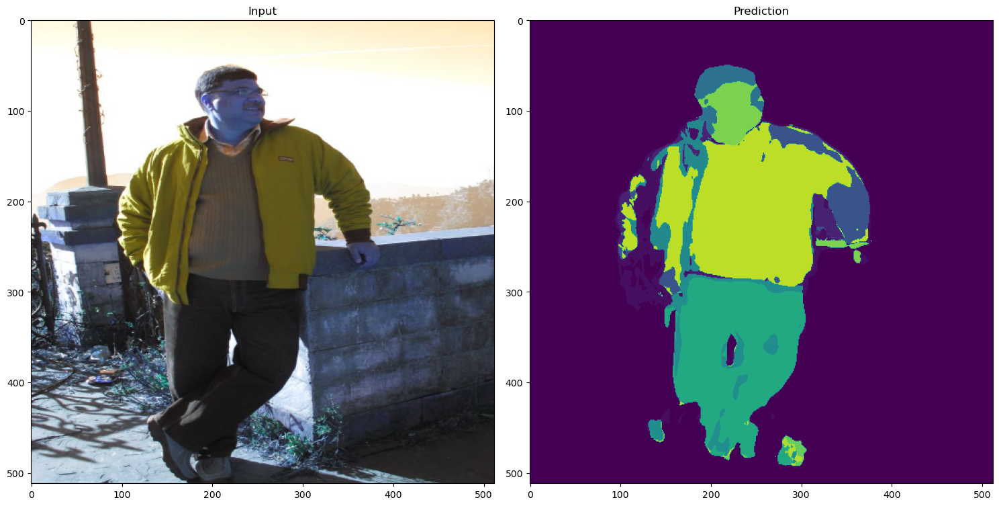

In [31]:
import matplotlib.pyplot as plt
import cv2

# Assuming you already have the trained model 'unet'
# Assuming you have the test data stored in 'x_test'



# Plot the input image
plt.figure(figsize=(15, 15))
plt.subplot(1, 2, 1)

plt.imshow(gandu[0])
plt.title('Input')


# Plot the prediction
plt.subplot(1, 2, 2)
plt.imshow(pred_mask_gan)
plt.title('Prediction')

plt.tight_layout()
plt.show()

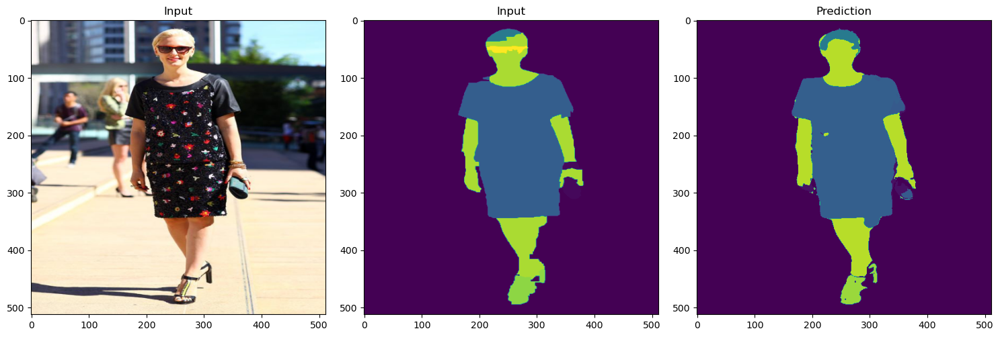

In [32]:
import matplotlib.pyplot as plt
import cv2

# Assuming you already have the trained model 'unet'
# Assuming you have the test data stored in 'x_test'



# Plot the input image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
x_train1 = cv2.cvtColor(image_train[75], cv2.COLOR_BGR2RGB)
plt.imshow(x_train1)
plt.title('Input')

# Plot the input image
plt.subplot(1, 3, 2)
plt.imshow(mask_train[75][:,:,0])
plt.title('Input')

# Plot the prediction
plt.subplot(1, 3, 3)
plt.imshow(pred_mask)
plt.title('Prediction')

plt.tight_layout()
plt.show()


In [33]:
x_train1.shape
prediction.shape

# shirt = prediction[0,:,:,38]
# shirt.shape

(1, 512, 512, 59)

##**JUST TESTING**

## **CUTTING**

In [34]:
#image_train = np.array(x_train1)
mask_pred = np.array(pred_mask)
# mask_pred.shape
mask_pred.dtype
# image_train.dtype
# x_train1.size

dtype('int64')

In [35]:
mask_pred = mask_pred.astype(np.uint8)
mask_pred.shape

(512, 512, 1)

In [36]:
import numpy as np

# Assuming you have an array called 'image_train'
image_data_type = x_train1.dtype
print("Image data type:", image_data_type)

# Assuming you have an array called 'mask_train'
mask_data_type = mask_train.dtype
print("Mask data type:", mask_data_type)
# print(new_mask_train_shape)


Image data type: uint8
Mask data type: uint8


In [37]:

# Perform the bitwise masking operation
masked_image1 = cv2.bitwise_and(x_train1, x_train1, mask=mask_pred)


In [38]:
print(x_train1.shape)
print(masked_image1.shape)
print(mask_pred.shape)

(512, 512, 3)
(512, 512, 3)
(512, 512, 1)


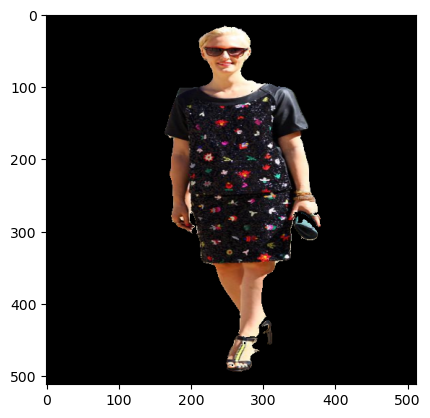

In [39]:
import matplotlib.pyplot as plt

plt.imshow(masked_image1)
plt.show()

(512, 512, 3)


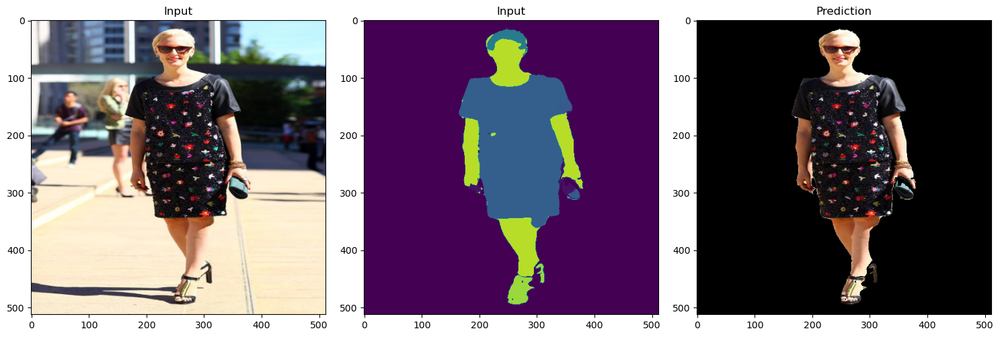

In [40]:
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
x_train1 = cv2.cvtColor(image_train[75], cv2.COLOR_BGR2RGB)
plt.imshow(x_train1)
print(x_train1.shape)
plt.title('Input')

# Plot the input image
plt.subplot(1, 3, 2)
plt.imshow(mask_pred)
plt.title('Input')

# Plot the prediction
plt.subplot(1, 3, 3)
#rgb_image = cv2.cvtColor(masked_image1[21], cv2.COLOR_BGR2RGB)

# Display the RGB image using Matplotlib
plt.imshow(masked_image1)
plt.title('Prediction')

plt.tight_layout()
plt.show()

In [41]:
masked_image.shape

(1000, 512, 512, 3)

In [42]:
#masked_image = cv2.bitwise_and(image_train, image_train, mask=mask_train[47])

In [43]:
# def show_predictions(dataset=None, num=1):
#     """
#     Displays the first image of each of the num batches
#     """
#     if dataset:
#         for image, mask in dataset.take(num):
#             pred_mask = u.predict(image)
#             display([image[0], mask[0], create_mask(pred_mask)])
#     else:
#         display([image_train[8], masks_train[8],
#              create_mask(u.predict(image_train[8][tf.newaxis, ...]))])

# **STYLE TRANSFER**

In [1]:
!pip install opendatasets
!pip install cv2
!pip install numpy

ERROR: Could not find a version that satisfies the requirement cv2 (from versions: none)
ERROR: No matching distribution found for cv2


In [2]:
import opendatasets as od
import pandas as pd

od.download("https://www.kaggle.com/datasets/splcher/animefacedataset")

Skipping, found downloaded files in "./animefacedataset" (use force=True to force download)


In [3]:
import tensorflow as tf
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
import matplotlib.pyplot as plt
import tensorflow.keras.backend as K
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.vgg19 import VGG19

In [4]:
import os
import cv2
import numpy as np

# Path to the dataset directory
dataset_dir = '/Users/udbhavagarwal/Desktop/animefacedataset/images'


# Initialize lists to store images and labels
images = []
labels = []
i=0

# Iterate through each image file
for filename in os.listdir(dataset_dir[0:5000]):
    # Load the image using OpenCV
    image = cv2.imread(os.path.join(dataset_dir, filename))

    # Resize the image to a desired size (e.g., 128x128)
    image = cv2.resize(image, (512, 512,))

    # Append the image to the images list
    images.append(image)
    i+=1
    if i == 5000:
      break

# Convert the lists to NumPy arrays
x_train = np.array(images)

Style Image Upload

In [17]:
dataset_dir2 = "/Users/udbhavagarwal/Desktop/2.jpeg"
#
img = []

# for filename in os.listdir(dataset_dir1[0:5000]):
    # Load the image using OpenCV
Image = cv2.imread(dataset_dir2)

    # Resize the image to a desired size (e.g., 128x128)
Image = cv2.resize(Image, (512, 512,))

    # Append the image to the images list
img.append(Image)

fun_t = np.array(img)

Content Image Upload

In [18]:
dataset_dir1 = "/Users/udbhavagarwal/Desktop/00001.jpg"
#
images = []

# for filename in os.listdir(dataset_dir1[0:5000]):
    # Load the image using OpenCV
image = cv2.imread(dataset_dir1)

    # Resize the image to a desired size (e.g., 128x128)
image = cv2.resize(image, (512, 512,))

    # Append the image to the images list
images.append(image)

fun_T = np.array(images)

In [19]:
VGG_LAYERS = [
    'block1_conv1', 'block1_conv2',
    'block2_conv1', 'block2_conv2',
    'block3_conv1', 'block3_conv2',
    'block3_conv3', 'block3_conv4',
    'block4_conv1',
]

class WaveLet_pooling(tf.keras.layers.Layer):

    # def __init__(self, name):
    #     super(WaveLet_pooling, self).__init__(name=name)
    #     # Calculation of Haar Wavelets.
    #     self.kernel_LL = tf.constant([[1, 1], [1, 1]], dtype=tf.float32) / 4
    #     self.kernel_HH = tf.constant([[-1, 1], [-1, 1]], dtype=tf.float32) / 4

    # def call(self, inputs):
    #     LL_in, HH_in, tensor_in = inputs
    #     out_shape = tf.shape(tensor_in)
    #     LL = tf.nn.conv2d_transpose(LL_in, tf.expand_dims(tf.expand_dims(self.kernel_LL, axis=0), axis=-1), output_shape=out_shape, strides=[1, 2, 2, 1], padding='SAME')
    #     HH = tf.nn.conv2d_transpose(HH_in, tf.expand_dims(tf.expand_dims(self.kernel_HH, axis=0), axis=-1), output_shape=out_shape, strides=[1, 2, 2, 1], padding='SAME')
    #     return tf.concat([LL, HH, tensor_in], axis=-1)

    # def compute_output_shape(self, input_shape):
    #     _ip_shape = input_shape[0]
    #     shape = (
    #         _ip_shape[0],
    #         _ip_shape[1] * 2,
    #         _ip_shape[2] * 2,
    #         sum(ips[3] for ips in input_shape)
    #     )
    #     return shape
    def __init__(self, name):
        super(WaveLet_pooling, self).__init__(name=name)
        # Calculation of Haar Wavelets.
        sqrt_2 = tf.math.sqrt(tf.constant(2, dtype=tf.float32))
        L = tf.constant([[1, 1]], dtype=tf.float32) / sqrt_2
        H = tf.constant([[-1,1]], dtype=tf.float32) / sqrt_2

        self.LL = tf.reshape(tf.math.multiply(tf.transpose(L), L), (1, 2, 2, 1))
        # self.LH = tf.reshape(tf.math.multiply(tf.transpose(L), H), (1, 2, 2, 1))
        # self.HL = tf.reshape(tf.math.multiply(tf.transpose(H), L), (1, 2, 2, 1))
        self.HH = tf.reshape(tf.math.multiply(tf.transpose(H), H), (1, 2, 2, 1))

    def call(self, inputs):
        LL, HH = self.repeat_filters(inputs.shape[-1])
        return [
            tf.nn.conv2d(inputs, LL, strides=[1, 2, 2, 1], padding='SAME'),
            # tf.nn.conv2d(inputs, LH, strides=[1, 2, 2, 1], padding='SAME'),
            # tf.nn.conv2d(inputs, HL, strides=[1, 2, 2, 1], padding='SAME'),
            tf.nn.conv2d(inputs, HH, strides=[1, 2, 2, 1], padding='SAME')
        ]

    def compute_output_shape(self, input_shape):
        shape = (
            input_shape[0], input_shape[1] // 2, input_shape[2] // 2, input_shape[3]
        )
        return [shape, shape, shape, shape]

    # def repeat_filters(self, repeats):
    #     return [                               # gpt wala
    #         tf.tile(tf.expand_dims(tf.expand_dims(self.kernel_LL, axis=0), axis=-1), [repeats, 1, 1, 1]),
    #         tf.tile(tf.expand_dims(tf.expand_dims(self.kernel_HH, axis=0), axis=-1), [repeats, 1, 1, 1])]

    def repeat_filters(self, repeats):
        return [
            tf.transpose(tf.repeat(self.LL, repeats, axis=0), (1, 2, 3, 0)),
            # tf.transpose(tf.repeat(self.LH, repeats, axis=0), (1, 2, 3, 0)),
            # tf.transpose(tf.repeat(self.HL, repeats, axis=0), (1, 2, 3, 0)),
            tf.transpose(tf.repeat(self.HH, repeats, axis=0), (1, 2, 3, 0))
        ]


class WaveLet_unpooling(tf.keras.layers.Layer):


    def __init__(self, name):
        super(WaveLet_unpooling, self).__init__()
        self._name = name
        # Calculation of Haar Wavelets.
        sqrt_2 = tf.math.sqrt(tf.constant(2, dtype=tf.float32))
        L = tf.constant([[1, 1]], dtype=tf.float32)/sqrt_2
        H = tf.constant([[-1,1]], dtype=tf.float32)/sqrt_2

        self.LL = tf.reshape(tf.math.multiply(tf.transpose(L), L), (1, 2, 2, 1))
        # self.LH = tf.reshape(tf.math.multiply(tf.transpose(L), H), (1, 2, 2, 1))
        # self.HL = tf.reshape(tf.math.multiply(tf.transpose(H), L), (1, 2, 2, 1))
        self.HH = tf.reshape(tf.math.multiply(tf.transpose(H), H), (1, 2, 2, 1))

    def call(self, inputs):
        LL_in, HH_in, tensor_in = inputs
        LL, HH = self.repeat_filters(LL_in.shape[-1])
        out_shape = tf.shape(tensor_in)
        return tf.concat([
            tf.nn.conv2d_transpose(LL_in, LL, output_shape=out_shape, strides=[1, 2, 2, 1], padding='SAME'),
            # tf.nn.conv2d_transpose(LH_in, LH, output_shape=out_shape, strides=[1, 2, 2, 1], padding='SAME'),
            # tf.nn.conv2d_transpose(HL_in, HL, output_shape=out_shape, strides=[1, 2, 2, 1], padding='SAME'),
            tf.nn.conv2d_transpose(HH_in, HH, output_shape=out_shape, strides=[1, 2, 2, 1], padding='SAME'),
            tensor_in,
        ], axis=-1)

    def compute_output_shape(self, input_shape):
        _ip_shape = input_shape[0]
        shape = (
            _ip_shape[0],
            _ip_shape[1] * 2,
            _ip_shape[2] * 2,
            sum(ips[3] for ips in input_shape)
        )
        return shape

    # def repeat_filters(self, repeats):
    #     return [
    #         tf.tile(tf.expand_dims(tf.expand_dims(self.kernel_LL, axis=0), axis=-1), [repeats, 1, 1, 1]),
    #         tf.tile(tf.expand_dims(tf.expand_dims(self.kernel_HH, axis=0), axis=-1), [repeats, 1, 1, 1])
    #     ]
    def repeat_filters(self, repeats):
        return [
            tf.transpose(tf.repeat(self.LL, repeats, axis=0), (1, 2, 3, 0)),
            # tf.transpose(tf.repeat(self.LH, repeats, axis=0), (1, 2, 3, 0)),
            # tf.transpose(tf.repeat(self.HL, repeats, axis=0), (1, 2, 3, 0)),
            tf.transpose(tf.repeat(self.HH, repeats, axis=0), (1, 2, 3, 0)),
        ]


class Whitening_Coloring(tf.keras.layers.Layer):
      def __init__(self, alpha=1.0):
        super(Whitening_Coloring, self).__init__()
        self.alpha = alpha

      def call(self, inputs):
        content, style = inputs
        eps = 1e-8
        alpha = self.alpha

        content_t = tf.transpose(tf.squeeze(content), (2, 0, 1))
        style_t = tf.transpose(tf.squeeze(style), (2, 0, 1))

        Cc, Hc, Wc = content_t.shape
        Cs, Hs, Ws = style_t.shape

        content_flat = tf.reshape(content_t, (Cc, Hc * Wc))
        style_flat = tf.reshape(style_t, (Cs, Hs * Ws))

        mc = tf.reduce_mean(content_flat, axis=1, keepdims=True)
        fc = content_flat - mc
        fcfc = tf.linalg.matmul(fc, fc, transpose_b=True) / (tf.cast(Hc * Wc, tf.float32) - 1.) + tf.eye(Cc) * eps

        ms = tf.reduce_mean(style_flat, axis=1, keepdims=True)
        fs = style_flat - ms
        fsfs = tf.linalg.matmul(fs, fs, transpose_b=True) / (tf.cast(Hs * Ws, tf.float32) - 1.) + tf.eye(Cs) * eps

        with tf.device('/cpu:0'):
          Sc, Uc, _ = tf.linalg.svd(fcfc)
          Ss, Us, _ = tf.linalg.svd(fsfs)

        k_c = tf.reduce_sum(tf.cast(tf.greater(Sc, 1e-5), tf.float32)).numpy()
        k_s = tf.reduce_sum(tf.cast(tf.greater(Ss, 1e-5), tf.float32)).numpy()

        k_c, k_s = int(k_c), int(k_s)

        Dc = tf.linalg.diag(tf.pow(Sc[:k_c], -0.5))
        fc_hat = tf.matmul(tf.matmul(tf.matmul(Uc[:, : k_c], Dc), Uc[:, : k_c], transpose_b=True), fc)

        Ds = tf.linalg.diag(tf.pow(Ss[:k_s], 0.5))
        fcs_hat = tf.matmul(tf.matmul(tf.matmul(Us[:, : k_s], Ds), Us[:, : k_s], transpose_b=True), fc_hat)

        fcs_hat = fcs_hat + ms

        blended = alpha * fcs_hat + (1 - alpha) * (fc + mc)

        blended = tf.reshape(blended, (Cc, Hc, Wc))

        blended = tf.expand_dims(tf.transpose(blended, (1, 2, 0)), 0)

        return blended


In [20]:
class WCT2:
    def __init__(
        self,
        lr=1e-3,
        gram_loss_weight=1.0,
        checkpoint_path="checkpoints/wtc2.h5",
    ):
        self.lr = lr
        self.img_shape = (None, None, 3)
        self.checkpoint_path = checkpoint_path

        img = Input(self.img_shape)
        self.wct = self.build_wct_model()
        self.wct.compile(optimizer=Adam(self.lr), loss=["mse", self.gram_loss])

        self.init_transfer_sequence()

    def gram_loss(self, img, gen_img):
        feat_gens = self.encoder(gen_img)
        feats = self.encoder(img)

        gram_gen = [gram_matrix(f) for f in feat_gens]
        gram_in = [gram_matrix(f) for f in feats]
        num_style_layers = len(gram_gen)
        loss_list = [
            K.mean(K.square(gram_gen[i] - gram_in[i]))
            for i in range(num_style_layers)
        ]

        gram_loss = tf.reduce_sum(loss_list) / num_style_layers
        return gram_loss

    def conv_block(self, x, filters, kernel_size, activation='relu', name=""):
        x = Conv2D(
            filters, kernel_size=kernel_size, strides=1,
            padding='same', activation=activation, name=name)(x)

        return x

    def copy_layer(self, x, kernel_size, model, layer, name):
        """
        Need to copy layer for unique name
        """
        origin_layer = model.get_layer(layer)
        filters = origin_layer.output_shape[-1]
        return self.conv_block(x, filters, kernel_size,
                               name=origin_layer.name + name)

    def build_wct_model(self):
        img = Input(self.img_shape, name='in_img')
        kernel_size = 3
        skips = []

        vgg_model = VGG19(include_top=False,
                          weights='imagenet',
                          input_tensor=Input(self.img_shape),
                          input_shape=self.img_shape)

        vgg_model.trainable = False
        for layer in vgg_model.layers:
            layer.trainable = False

        vgg_output = [
            vgg_model.get_layer(f'block{i}_conv1').get_output_at(0)
            for i in {1, 2, 3, 4}
        ]

        self.encoder = Model(inputs=vgg_model.inputs,
                             outputs=vgg_output,
                             name='encoder')

        # ======= Encoder ======= #
        id_ = 0
        x = self.copy_layer(img, kernel_size, vgg_model,
                            VGG_LAYERS[0], name='_encode')
        for layer in VGG_LAYERS[1:]:
            x = self.copy_layer(x, kernel_size, vgg_model, layer, name='_encode')
            if layer in {'block1_conv2', 'block2_conv2', 'block3_conv4'}:
                to_append = [x]
                x, hh = WaveLet_pooling('wave_let_pooling_{}'.format(id_))(x)
                to_append += [hh]
                skips.append(to_append)
                id_ += 1

        # ======= Decoder ======= #
        skip_id = 2
        for layer in VGG_LAYERS[::-1][:-1]:
            filters = vgg_model.get_layer(layer).output_shape[-1]
            name = layer + "_decode"
            if layer in {'block4_conv1', 'block3_conv1', 'block2_conv1'}:
                x = self.conv_block(x, filters // 2, kernel_size, name=name)
                original,hh = skips[skip_id]
                x = WaveLet_unpooling('wave_let_unpooling_{}'.format(skip_id))([x, hh, original])
                skip_id -= 1
            else:
                x = self.conv_block(x, filters, kernel_size, name=name)

        out = self.conv_block(x, 3, kernel_size, 'linear', name="output")

        wct = Model(inputs=img, outputs=out, name='wct')

        for layer in wct.layers:
            # dont train waveletpooling layers
            if "_encode" in layer.name:
                name = layer.name.replace("_encode", "")
                layer.set_weights(vgg_model.get_layer(name).get_weights())
                layer.trainable = False

        return wct

    def get_callbacks(self):
        return [
            tf.keras.callbacks.ModelCheckpoint(
                filepath=self.checkpoint_path,
                monitor="val_loss",
                save_best_only=True,
                verbose=1,
            ),
            tf.keras.callbacks.ReduceLROnPlateau(
                monitor='val_loss', factor=0.1, patience=2, verbose=1,
                mode='auto', min_delta=0.0001, cooldown=0, min_lr=0
            )
        ]

    def train(self, train_dat, epochs, batch_size, validation_split = 0.2):
      train_data = tf.data.Dataset.from_tensor_slices((train_dat, train_dat))
      train_data = train_data.batch(batch_size)

      num_validation_samples = int(validation_split * len(train_dat))
      validation_data = train_data.take(num_validation_samples)
      train_data = train_data.skip(num_validation_samples)

      # reduce_lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
      #   monitor='val_loss', factor=0.1, patience=2, verbose=1,
      #   mode='auto', min_delta=0.0001, cooldown=0, min_lr=0
      # )

      checkpoint_path = "/Users/udbhavagarwal/style_ckpt/model_weights.ckpt"
      checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=1, save_weights_only=True, save_best_only=True, mode='min')

      self.history = self.wct.fit(
        train_data,
        epochs=epochs,
        validation_data=validation_data,
        callbacks = [checkpoint]
      )

    def plot_history(self):
        plt.plot(self.history['loss'], label='train loss')
        plt.plot(self.history['val_loss'], label='val loss')
        plt.ylabel('loss')
        plt.xlabel('epoch')
        plt.title('Segmentation model')
        plt.legend()
        plt.show()


    def transfer(self, content_img, style_img, alpha=1.0):
        
        # Assuming content_img and style_img have shape (batch_size, height, width, channels)
        content_img_rgb = content_img[:, :, :, :3]
        style_img_rgb = style_img[:, :, :, :3]

        # ===== Encode ===== #
        # step 1.
        content_feat, style_feat = self.en_1([content_img_rgb]), self.en_1([style_img_rgb])
        content_feat = Whitening_Coloring(alpha)([content_feat, style_feat])
        # step 2.
        content_feat, c_skips_1 = self.pool_1([content_feat])
        style_feat, s_skips_1 = self.pool_1([style_feat])
        c_skips_1 = [Whitening_Coloring(alpha)([c_skips_1[i], s_skips_1[i]]) for i in range(2)]
        content_feat = Whitening_Coloring(alpha)([content_feat, style_feat])
        # step 3.
        content_feat, c_skips_2 = self.pool_2([content_feat])
        style_feat, s_skips_2 = self.pool_2([style_feat])
        c_skips_2 = [Whitening_Coloring(alpha)([c_skips_2[i], s_skips_2[i]]) for i in range(2)]
        content_feat = Whitening_Coloring(alpha)([content_feat, style_feat])
        # step 4.
        content_feat, c_skips_3 = self.pool_3([content_feat])
        style_feat, s_skips_3 = self.pool_3([style_feat])
        c_skips_3 = [Whitening_Coloring(alpha)([c_skips_3[i], s_skips_3[i]]) for i in range(2)]
        content_feat = Whitening_Coloring(alpha)([content_feat, style_feat])

        # ===== Decode ===== #
        # step 1.
        content_feat, style_feat = self.de_1([content_feat]), self.de_1([style_feat])
        content_feat = Whitening_Coloring(alpha)([content_feat, style_feat])
        # step 2.
        content_feat = self.unpool_1([content_feat] + c_skips_3)
        style_feat = self.unpool_1([style_feat] + s_skips_3)
        content_feat = Whitening_Coloring(alpha)([content_feat, style_feat])
        content_feat = self.de_2([content_feat])
        style_feat = self.de_2([style_feat])
        # step 3.
        content_feat = self.unpool_2([content_feat] + c_skips_2)
        style_feat = self.unpool_2([style_feat] + s_skips_2)
        content_feat = Whitening_Coloring(alpha)([content_feat, style_feat])
        content_feat = self.de_3([content_feat])
        style_feat = self.de_3([style_feat])

        content_feat = self.unpool_3([content_feat] + c_skips_1)
        style_feat = self.unpool_3([style_feat] + s_skips_1)

        content_feat = Whitening_Coloring(alpha)([content_feat, style_feat])

        output = self.final([content_feat])
        output = output.numpy()

        return output.clip(min=0, max=255.0)

    def init_transfer_sequence(self):
        # ===== encoder layers ===== #
        self.en_1 = get_predict_function(self.wct, ['in_img', 'block1_conv1_encode'], name='en_1')

        self.pool_1 = get_predict_function(
            self.wct,
            ['block1_conv2_encode', 'wave_let_pooling_0', 'block2_conv1_encode'],
            name='pool_1')

        self.pool_2 = get_predict_function(
            self.wct,
            ['block2_conv2_encode', 'wave_let_pooling_1', 'block3_conv1_encode'],
            name='pool_2')

        self.pool_3 = get_predict_function(
            self.wct,
            [
                'block3_conv2_encode', 'block3_conv3_encode',
                'block3_conv4_encode',
                'wave_let_pooling_2', 'block4_conv1_encode'
            ],
            name='pool_3')

        # ===== decoder layers ===== #
        self.de_1 = get_predict_function(self.wct, ['block4_conv1_decode'], name='de_1')

        self.unpool_1 = get_predict_function(
            self.wct,
            [
                'wave_let_unpooling_2', 'block3_conv4_decode',
                'block3_conv3_decode', 'block3_conv2_decode'
            ],
            name='unpool_1')

        self.de_2 = get_predict_function(self.wct, ['block3_conv1_decode'], name='de_2')

        self.unpool_2 = get_predict_function(
            self.wct,
            ['wave_let_unpooling_1', 'block2_conv2_decode'],
            name='unpool_2')

        self.de_3 = get_predict_function(self.wct, ['block2_conv1_decode'], name='de_3')

        self.unpool_3 = get_predict_function(
            self.wct,
            ['wave_let_unpooling_0', 'block1_conv2_decode'],
            name='unpool_3')

        self.final = get_predict_function(self.wct, ['output'], name='final')


In [21]:

def gram_matrix(input_tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1] * input_shape[2], tf.float32)
    return result / (num_locations)

def _get_output(x, layer):
    if "_pooling" in layer.name:
        # return 4 outputs
        ll, hh = layer(x)
        return ll, [hh, x]
    return layer(x), None

def _copy_input(layer):
    # :1 to remove batch_size
    if hasattr(layer, 'input_shape'):
        ip_shape = layer.input_shape[1:]
    else:
        ip_shape = layer.shape[1:]
    return tf.keras.layers.Input(shape=ip_shape)

def get_predict_function(model, layers, name):
    skips_out = None

    if layers[0] == 'in_img':
        ip = model.get_layer(layers[0]).input
        start = 1
    elif 'unpooling' in layers[0]:
        # multi inputs
        ip = [
            _copy_input(l) for l in model.get_layer(layers[0]).input
        ]
        start = 0
    else:
        ip = _copy_input(model.get_layer(layers[0]))
        start = 0

    x, skips = _get_output(ip, model.get_layer(layers[start]))

    if skips is not None:
        skips_out = skips

    for layer in layers[start + 1:]:
        x, skips = _get_output(x, model.get_layer(layer))
        if skips is not None:
            skips_out = skips

    outputs = [x] if skips_out is None else [x, skips_out]
    return tf.keras.models.Model(inputs=ip, outputs=outputs, name=name)

In [22]:
unet = WCT2(lr=1e-3, gram_loss_weight=1.0, checkpoint_path="checkpoints/wtc2.h5")
unet.input_shape = (512, 512, 3)  # Update the input shape


In [23]:
unet.wct.load_weights("/Users/udbhavagarwal/style_ckpt/model_weights.ckpt")

Model Training

currently commented because model is sufficiently trained

In [24]:
# from tensorflow.keras.models import Model
# from tensorflow.keras.callbacks import ModelCheckpoint

# # checkpoint_path = "/content/drive/MyDrive/Model_ckpt_style/model_weights.ckpt"
# # checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=1, save_weights_only=True, save_best_only=True, mode='min')

# unet.train(x_train[0:500], epochs=10, batch_size=1)
# # unet.wct.summary()

In [25]:
import numpy as np

# Assuming you already have the trained model 'unet'

#Assuming you have the test data stored in 'x_test'
# x_test0 = prediction1[0]  # Take a single sample from the training data
# x_test0 = np.expand_dims(x_test0, axis=0)

x_test1 = fun_T[0]  # Take a single sample from the training data
x_test1 = np.expand_dims(x_test1, axis=0)  # Add an extra dimension for the batch size

x_test2 = fun_t[0]  # Take a single sample from the training data
x_test2 = np.expand_dims(x_test2, axis=0)

# Make predictions
prediction1 = unet.transfer(x_test1,x_test2)
prediction_rescaled1 = (prediction1 - prediction1.min()) / (prediction1.max() - prediction1.min())


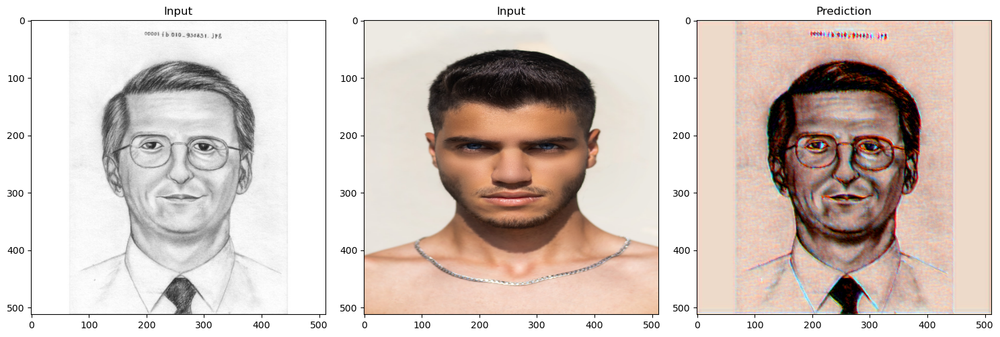

In [26]:
import matplotlib.pyplot as plt

# Assuming you already have the trained model 'unet'
# Assuming you have the test data stored in 'x_test'



# Plot the input image
plt.figure(figsize=(15, 15))
plt.subplot(1, 3, 1)
x_trai1 = cv2.cvtColor(fun_T[0], cv2.COLOR_BGR2RGB)
plt.imshow(x_trai1)
plt.title('Input')

# Plot the input image
plt.subplot(1, 3, 2)
x_trai2 = cv2.cvtColor(fun_t[0], cv2.COLOR_BGR2RGB)
plt.imshow(x_trai2)
plt.title('Input')

# Plot the prediction
plt.subplot(1, 3, 3)
pred1 = cv2.cvtColor(prediction_rescaled1[0], cv2.COLOR_BGR2RGB)
plt.imshow(pred1)
plt.title('Prediction')

plt.tight_layout()
plt.show()


# **Segmented Style**

Applying Style Transfer to Original Dataset

-> Applying anime style to Real People dataset

In [58]:
!pip install kaggle


In [59]:
!pip install opendatasets

In [60]:
!pip install tensorflow_addons

In [61]:
import tensorflow as tf
import keras
import numpy as np
import os
import cv2
import tensorflow_addons as tfa
import matplotlib.pyplot as plt
import warnings
import opendatasets as od
import pandas as pd
warnings.filterwarnings("ignore", category=DeprecationWarning)  #Ignores all Deprecation warnings
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, AveragePooling2D, Dropout
from tensorflow.keras.layers import Conv2DTranspose, concatenate, Activation, Flatten, Dense, BatchNormalization





image_train -> Training Dataset of the real people data
x_train -> Training Dataset of the anime data

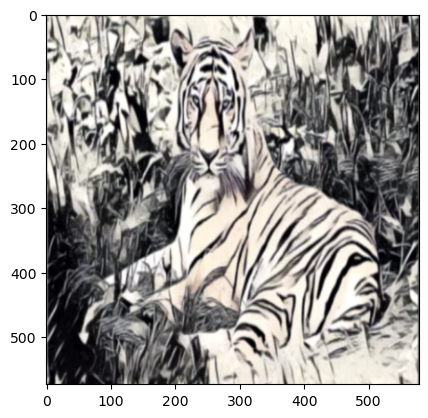

In [62]:
van_gogh = cv2.imread('/Users/udbhavagarwal/Desktop/NeuralBlend Style + content/tiger.png')
# van_gogh = cv2.imread('/Users/udbhavagarwal/Desktop/color_cat.jpeg')
stars = cv2.cvtColor(van_gogh, cv2.COLOR_BGR2RGB)
plt.imshow(stars)

stars_ar = np.array(van_gogh)

In [63]:
import numpy as np

# Assuming you already have the trained model 'unet'

# Assuming you have the test data stored in 'x_test'
x_test1 = image_train[69]  # Take a single sample from the training data
#x_test1 = fun_T[0]
x_test1 = np.expand_dims(x_test1, axis=0)  # Add an extra dimension for the batch size

x_test2 = stars_ar  # Take a single sample from the training data
x_test2 = np.expand_dims(x_test2, axis=0)

# Make predictions
prediction = unet.transfer(x_test1,x_test2)
prediction_rescaled = (prediction - prediction.min()) / (prediction.max() - prediction.min())

In [64]:
# import matplotlib.pyplot as plt

# # Assuming you already have the trained model 'unet'
# # Assuming you have the test data stored in 'x_test'



# # Plot the input image
# plt.figure(figsize=(15, 15))
# plt.subplot(1, 3, 1)
# x_trai1 = cv2.cvtColor(x_test1, cv2.COLOR_BGR2RGB)
# plt.imshow(x_trai1)
# plt.title('Input')

# # Plot the input image
# plt.subplot(1, 3, 2)
# x_trai2 = cv2.cvtColor(stars_ar, cv2.COLOR_BGR2RGB)
# plt.imshow(x_trai2)
# plt.title('Input')

# # Plot the prediction
# plt.subplot(1, 3, 3)
pred = cv2.cvtColor(prediction_rescaled[0], cv2.COLOR_BGR2RGB)
# plt.imshow(pred2)
# plt.title('Prediction')

# plt.tight_layout()
# plt.show()

1/1 [==============================] - 0s 43ms/step
float32


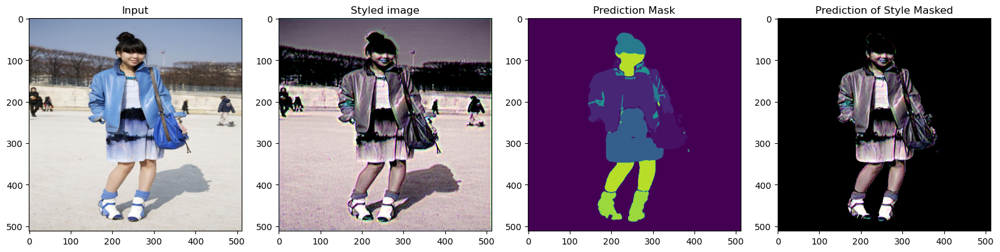

In [65]:
# Assuming you already have the trained model 'unet'
# Take a single sample from the training data
x_test = image_train[69]
x_test = np.expand_dims(x_test, axis=0)

# Make predictions
prediction = u.predict(x_test)
print(prediction.dtype)
pred_mask = create_mask(prediction)

mask_pred = np.array(pred_mask)
mask_pred = mask_pred.astype(np.uint8)
masked_image1 = cv2.bitwise_and(pred, pred, mask=mask_pred)


plt.figure(figsize=(20, 20))

# Plot the input image
plt.subplot(1, 5, 1)
x_trai1 = cv2.cvtColor(image_train[69], cv2.COLOR_BGR2RGB)
plt.imshow(x_trai1)
plt.title('Input')


# Plot the input image
plt.subplot(1, 5, 2)
plt.imshow(pred)
plt.title('Styled image')

# Plot the prediction mask
plt.subplot(1, 5, 3)
plt.imshow(pred_mask)
plt.title('Prediction Mask')


plt.subplot(1, 5, 4)
plt.imshow(masked_image1)
plt.title('Prediction of Style Masked')


plt.tight_layout()
plt.show()



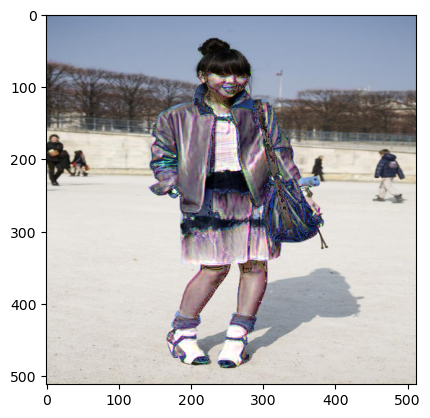

In [66]:
import cv2
import numpy as np

# Load the images
original_img = x_trai1
man_cutout = pred_mask
styled_man = masked_image1

# Load the images
original_img = np.array(original_img)
man_cutout = np.array(man_cutout)
styled_man = np.array(styled_man)

import matplotlib.pyplot as plt

# Convert the images to uint8 if they are not already
original_img = (original_img * 255).astype(np.uint8) if original_img.dtype != np.uint8 else original_img
styled_man = (styled_man * 255).astype(np.uint8) if styled_man.dtype != np.uint8 else styled_man

# Get a binary mask of the styled_man where the pixels are not black
mask = np.all(styled_man != [0, 0, 0], axis=-1)

# Create a copy of the original image
combined_img = original_img.copy()

# Replace the pixels of the original image with the styled_man pixels where the mask is True
combined_img[mask] = styled_man[mask]

# Display the result
plt.imshow(combined_img)
plt.show()



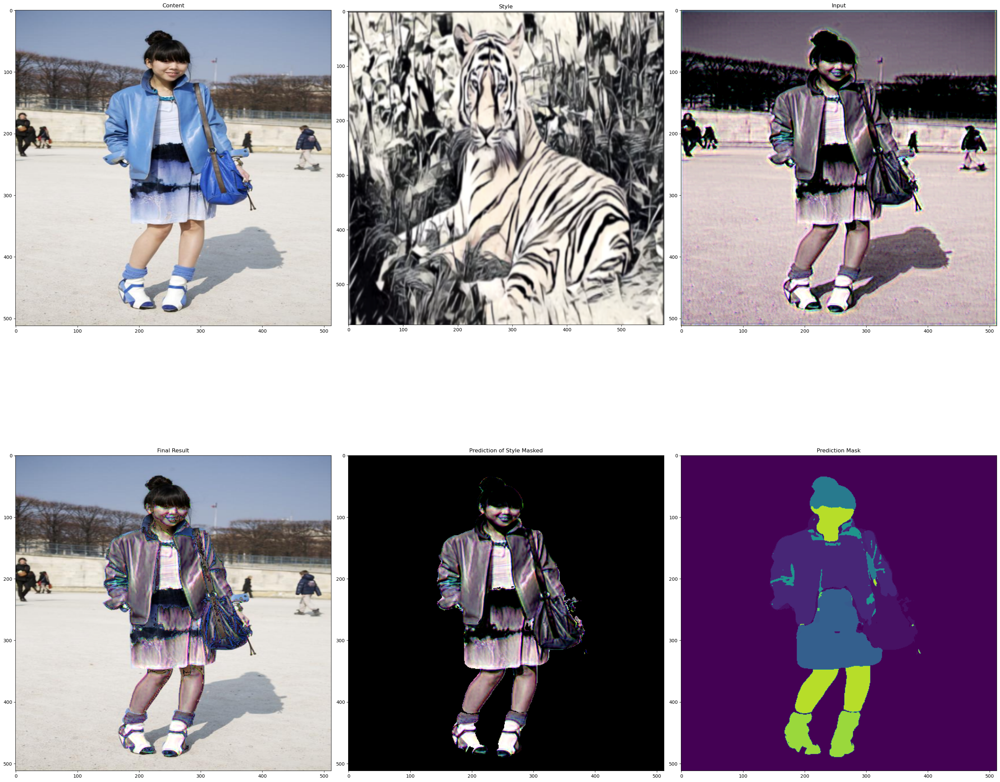

In [67]:
plt.figure(figsize=(30, 30))

# Plot the Content image
plt.subplot(2, 3, 1)
x_trai1 = cv2.cvtColor(image_train[69], cv2.COLOR_BGR2RGB)
plt.imshow(x_trai1)
plt.title('Content')

# Plot the Style image
plt.subplot(2, 3, 2)
x_trai2 = cv2.cvtColor(stars_ar, cv2.COLOR_BGR2RGB)
plt.imshow(x_trai2)
plt.title('Style')

# Plot the input image
plt.subplot(2, 3, 3)
plt.imshow(pred)
plt.title('Input')

# Plot the prediction mask
plt.subplot(2, 3, 6)
plt.imshow(pred_mask)
plt.title('Prediction Mask')

#Plot the Styles Mask
plt.subplot(2, 3, 5)
plt.imshow(masked_image1)
plt.title('Prediction of Style Masked')

#Plot the final Stiched Image
plt.subplot(2 ,3, 4)
plt.imshow(combined_img)
plt.title('Final Result')

plt.tight_layout()
plt.show()

# Creating Function to Process the image in altogether

In [68]:


def process_images(content_image_path, style_image_path):
    # Load content and style images
    content_image = cv2.imread(content_image_path)
    content_image_rgb = cv2.cvtColor(cv2.imread(content_image_path), cv2.COLOR_BGR2RGB)
    style_image = cv2.imread(style_image_path)

    
    content_image = cv2.resize(content_image,(512,512))
    style_image = cv2.resize(style_image,(512,512))
    content_image_rgb = cv2.resize(content_image_rgb,(512,512,))
    # content_ar = np.array(content_image)
    # style_ar = np.array(style_image)
    
    
    content_image = np.expand_dims(content_image, axis=0)  # Add an extra dimension for the batch size
    style_image = np.expand_dims(style_image, axis=0)

    # Make predictions
    prediction = unet.transfer(content_image,style_image)
    prediction_rescaled = (prediction - prediction.min()) / (prediction.max() - prediction.min()) #this is the complete styled images 
    pred = cv2.cvtColor(prediction_rescaled[0], cv2.COLOR_BGR2RGB)

    # Cutting
    content_prediction = u.predict(content_image)
    pred_mask1 = create_mask(content_prediction)
    mask_pred1 = np.array(pred_mask1)
    mask_pred1 = mask_pred1.astype(np.uint8)
    
    
    masked_cutout = cv2.bitwise_and(pred, pred, mask=mask_pred1)
    
    #Everything Working Fine Uptill here
    x_ar = content_image_rgb
    masked_cutout_ar = np.array(masked_cutout)
    x_ar = np.array(x_ar)
    
    x_ar = (x_ar * 255).astype(np.uint8) if x_ar.dtype != np.uint8 else x_ar
    masked_cutout_ar = (masked_cutout_ar * 255).astype(np.uint8) if masked_cutout_ar.dtype != np.uint8 else masked_cutout_ar
    
    # Get a binary mask of the styled_man where the pixels are not black
    mask_final = np.all(masked_cutout_ar != [0, 0, 0], axis=-1)

    # Create a copy of the original image
    combined_img = content_image_rgb.copy()

    # Replace the pixels of the original image with the styled_man pixels where the mask is True
    combined_img[mask_final] = masked_cutout_ar[mask_final]


    #|combined_img = cv2.cvtColor(combined_img,cv2.COLOR_BGR2RGB)
    

    # Return the processed image
   
    return combined_img


1/1 [==============================] - 0s 31ms/step


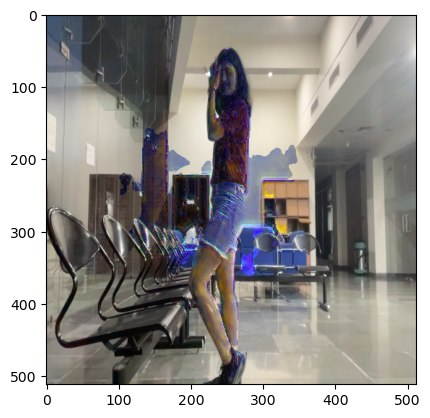

In [69]:
final = process_images('/Users/udbhavagarwal/Desktop/kani_chat.jpeg','/Users/udbhavagarwal/Desktop/NeuralBlend Style + content/stary_night.jpeg')
plt.imshow(final)
plt.show()



# Making the interface

In [73]:
import tkinter as tk
from tkinter import filedialog
from PIL import Image, ImageTk
import cv2

class Application(tk.Tk):
    def __init__(self):
        tk.Tk.__init__(self)
        self.geometry("1000x1000")
        self.content_image = None
        self.style_image = None
        self.content_image_path = None  # path to the content image
        self.style_image_path = None  # path to the style image

        # Buttons
        self.content_button = tk.Button(self, text="Load Content Image", command=self.load_content_image)
        self.content_button.pack()

        self.style_button = tk.Button(self, text="Load Style Image", command=self.load_style_image)
        self.style_button.pack()

        self.process_button = tk.Button(self, text="Process Images", command=self.process)
        self.process_button.pack()

        # Labels to display images
        self.content_label = tk.Label(self)
        self.content_label.pack()

        self.style_label = tk.Label(self)
        self.style_label.pack()

        self.result_label = tk.Label(self)
        self.result_label.pack()

    def load_content_image(self):
        filename = filedialog.askopenfilename()
        if filename:
            self.content_image_path = filename
            img = Image.open(filename)
            img.thumbnail((300,300))
            photo = ImageTk.PhotoImage(img)
            self.content_image = photo
            self.content_label.configure(image=photo)
            self.content_label.image = photo

    def load_style_image(self):
        filename = filedialog.askopenfilename()
        if filename:
            self.style_image_path = filename
            img = Image.open(filename)
            img.thumbnail((300,300))
            photo = ImageTk.PhotoImage(img)
            self.style_image = photo
            self.style_label.configure(image=photo)
            self.style_label.image = photo

    def process(self):
        if self.content_image_path is None or self.style_image_path is None:
            print("Must load content and style images first")
            return

        # Use self.content_image_path and self.style_image_path in your processing logic
        # Assuming process_images function in your model returns a PIL Image
        result = process_images(self.content_image_path, self.style_image_path)
        
        # Ensure the image data is in the correct range and type
        result = (result * 255).astype('uint8')

        # Convert the NumPy array to a PIL Image
        result = Image.fromarray(result)
        
        # Assuming `result` is your PIL Image object in BGR forma


        # Resize the image
        result.thumbnail((300,300))
        

        def bgr_to_rgb(image):
            b, g, r = image.split()
            return Image.merge("RGB", (r, g, b))
        
        result2 = bgr_to_rgb(result)

        

        # Convert the PIL Image to a PhotoImage to display in Tkinter
        photo = ImageTk.PhotoImage(result2)
        self.result_label.configure(image=photo)
        self.result_label.image = photo


app = Application()
app.mainloop()


2023-08-08 14:50:14.628 python[1542:20597] +[CATransaction synchronize] called within transaction
2023-08-08 14:50:21.486 python[1542:20597] +[CATransaction synchronize] called within transaction


1/1 [==============================] - 0s 35ms/step
